In [2]:
#
# BASIC IMPORTS
#
import re

from collections import Counter

import lda
import textmining
import numpy
import codecs

import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
#
# DATA READIN
#
f = codecs.open('data/NIV.txt', encoding='utf-16')

NIV_base = f.read()

# cut beginning
main_part_rx = re.compile(r'Genesis.+?(Genesis.*)', re.DOTALL)

NIV_tmp = re.findall(main_part_rx, NIV_base)[0]
main_part_rx = re.compile(r'(Genesis.+?)Genesis.*', re.DOTALL)
NIV_chapter_index = re.findall(main_part_rx, NIV_base)[0]
NIV_base = NIV_tmp

In [4]:
# get chapter index
NIV_chapter_index = re.sub('\r\n', '\n', NIV_chapter_index).strip().split('\n')

NIV_chapter_index = numpy.array(NIV_chapter_index)
# get rid of 'New Testament' headline
content = NIV_chapter_index[NIV_chapter_index != 'New Testament']

old = []
new = []
for chapter in enumerate(content):
    if chapter[0] < 39:
        old.append(chapter[1])
    else: 
        new.append(chapter[1])


In [5]:
# insert space after numbers
NIV_base = re.sub(r'(\d+)([^st|nd|rd|th])', r'\1 \2', NIV_base)
NIV_base

'Genesis\r\n\r\n\r\n1 In the beginning God created the \r\nheavens and the earth. \r\n2 Now the earth was formless and empty, \r\ndarkness was over the surface of the \r\ndeep, and the Spirit of God was \r\nhovering over the waters. \r\n3 And God said, "Let there be light," and \r\nthere was light. \r\n4 God saw that the light was good, and \r\nhe separated the light from the darkness. \r\n5 God called the light "day," and the \r\ndarkness he called "night." And there \r\nwas evening, and there was morning-\r\nthe first day. \r\n6 And God said, "Let there be an \r\nexpanse between the waters to \r\nseparate water from water." \r\n7 So God made the expanse and \r\nseparated the water under the expanse \r\nfrom the water above it. And it was so. \r\n8 God called the expanse "sky." And \r\nthere was evening, and there was \r\nmorning-the second day. \r\n9 And God said, "Let the water under the \r\nsky be gathered to one place, and let \r\ndry ground appear." And it was so. \r\n10 God call

In [6]:
# get chapters, distinguished by two new lines
chapters_rx = re.compile(r'[\r\n]{0,}(.+?)[\r\n]{3}', re.DOTALL)

NIV_chapters = re.findall(chapters_rx, NIV_base)


In [7]:
import itertools
NIV_chapters = dict(zip(NIV_chapters[0::2], NIV_chapters[1::2]))

In [8]:
NIV_chapters.keys()


dict_keys(['1st Kings', 'Hebrews', 'Romans', 'Joel', 'Song of Solomon', '2nd Kings', '2nd Timothy', '1st Chronicles', 'Haggai', '2nd John', 'Philippians', 'Ecclesiastes', 'Joshua', 'Colossians', '1st Timothy', 'James', '2nd Thessalonians', 'Job', 'Amos', 'Esther', 'Mark', 'Ephesians', '2nd Peter', '1st Thessalonians', 'John', 'Proverbs', 'Ezekiel', 'Revelation', 'Genesis', 'Hosea', 'Obadiah', 'Isaiah', '1st John', '1st Peter', 'Lamentations', 'Numbers', 'Psalms', 'Matthew', 'Habakkuk', '2nd Samuel', 'Zephaniah', 'Acts', 'Zechariah', 'Malachi', 'Deuteronomy', 'Jeremiah', 'Micah', 'Leviticus', 'Judges', 'Ezra', '1st Corinthians', 'Exodus', 'Galatians', 'Jonah', 'Nahum', 'Daniel', '2nd Corinthians', 'Jude', 'Luke', '3rd John', '1st Samuel', 'Titus', 'Nehemiah', '2nd Chronicles', 'Ruth', 'Philemon'])

In [9]:
# create new and old testament:
# assume unique Chapter titles
NIV_base_old = u''
NIV_base_new = u''

for chapter in old:
    NIV_base_old = NIV_base_old + NIV_chapters[chapter]

for chapter in new:
    NIV_base_new = NIV_base_new + NIV_chapters[chapter]

NIV_base_old

'1 In the beginning God created the \r\nheavens and the earth. \r\n2 Now the earth was formless and empty, \r\ndarkness was over the surface of the \r\ndeep, and the Spirit of God was \r\nhovering over the waters. \r\n3 And God said, "Let there be light," and \r\nthere was light. \r\n4 God saw that the light was good, and \r\nhe separated the light from the darkness. \r\n5 God called the light "day," and the \r\ndarkness he called "night." And there \r\nwas evening, and there was morning-\r\nthe first day. \r\n6 And God said, "Let there be an \r\nexpanse between the waters to \r\nseparate water from water." \r\n7 So God made the expanse and \r\nseparated the water under the expanse \r\nfrom the water above it. And it was so. \r\n8 God called the expanse "sky." And \r\nthere was evening, and there was \r\nmorning-the second day. \r\n9 And God said, "Let the water under the \r\nsky be gathered to one place, and let \r\ndry ground appear." And it was so. \r\n10 God called the dry ground "

In [10]:
#
# BASIC FREQUENCIES
#
from nltk.tokenize import RegexpTokenizer


tokenizer = RegexpTokenizer(r'\w+')
NIV_words = tokenizer.tokenize(NIV_base)


In [11]:
len(NIV_words)

760413

In [12]:
from nltk import FreqDist


fdist1 = FreqDist(NIV_words) 
print (fdist1.most_common(50))

[('the', 51418), ('and', 28180), ('of', 24982), ('to', 20634), ('you', 12407), ('in', 10684), ('will', 10065), ('I', 8816), ('a', 8671), ('he', 7243), ('is', 7053), ('Lord', 7047), ('his', 6872), ('your', 6327), ('for', 6266), ('not', 5808), ('with', 5766), ('that', 5569), ('him', 5420), ('them', 5161), ('be', 5007), ('they', 4916), ('who', 4784), ('from', 4766), ('it', 4609), ('on', 4344), ('all', 4248), ('my', 4242), ('have', 4204), ('was', 4126), ('God', 4077), ('me', 4015), ('The', 3915), ('are', 3785), ('their', 3540), ('as', 3484), ('said', 3183), ('had', 2784), ('this', 2714), ('s', 2533), ('were', 2518), ('out', 2396), ('has', 2363), ('He', 2333), ('by', 2319), ('one', 2294), ('but', 2234), ('people', 2199), ('king', 2185), ('man', 2122)]


In [13]:
# get longest words
longest_words = list(set([word for word in NIV_words if len(word) > 15]))

print (longest_words)

['insurrectionists', 'incomprehensible', 'responsibilities']


In [14]:
# get ngrams
from nltk import ngrams


n = 5
sixgrams = ngrams(NIV_words, n)

print (Counter(sixgrams).most_common(5))

[(('This', 'is', 'what', 'the', 'Lord'), 232), (('is', 'what', 'the', 'Lord', 'says'), 165), (('the', 'temple', 'of', 'the', 'Lord'), 162), (('the', 'Lord', 'the', 'God', 'of'), 151), (('the', 'word', 'of', 'the', 'Lord'), 149)]


In [15]:
#
# SENTENCES AND VERSE LENGTHS
#
from nltk.tokenize import PunktSentenceTokenizer
sentence_tokenizer = PunktSentenceTokenizer()
NIV_sentences = sentence_tokenizer.tokenize(NIV_base)

In [16]:
len(NIV_sentences)

39493

In [17]:
sentence_lengths = [len(sentence) for sentence in NIV_sentences]

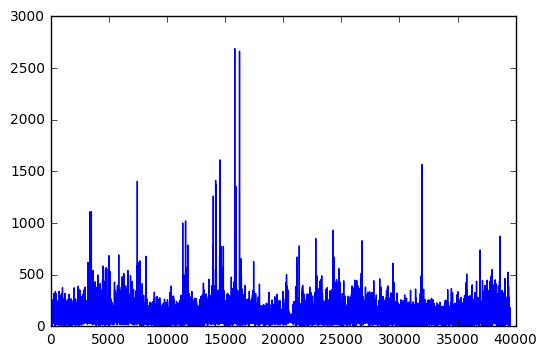

In [18]:
plt.plot(sentence_lengths)
plt.show()

In [19]:
#
# SENTENCES AND VERSE LENGTHS PER TESTAMENT
#
sentences_old = sentence_tokenizer.tokenize(NIV_base_old)
avg_sentence_lengths_old = numpy.median([len(sentence) for sentence in sentences_old])

sentences_new = sentence_tokenizer.tokenize(NIV_base_new)
avg_sentence_lengths_new = numpy.median([len(sentence) for sentence in sentences_new])

print (avg_sentence_lengths_old, avg_sentence_lengths_new)

90.0 87.0


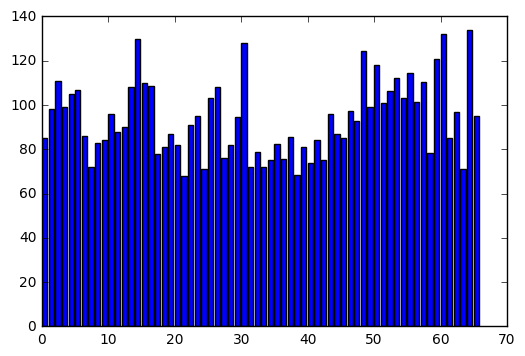

In [20]:
#
# SENTENCES AND VERSE LENGTHS PER CHAPTER
#
avg_sentence_lengths_per_chapter = []
for i in range(0, len(content)):
    chapter_tokenized = sentence_tokenizer.tokenize(NIV_chapters[content[i]])
    # avg_sentence_lengths_per_chapter.append(sum([len(sentence) for sentence in chapter_tokenized]) / float(len(chapter_tokenized)))
    avg_sentence_lengths_per_chapter.append(numpy.median([len(sentence) for sentence in chapter_tokenized]))


plt.bar(range(0, len(content)), avg_sentence_lengths_per_chapter)
plt.show()

In [21]:
#
# TFIDF
#
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(strip_accents='ascii', ngram_range=(0,3), stop_words='english')
NIV_words_tfidf = tfidf.fit_transform(NIV_words)

In [22]:
NIV_words_tfidf

<760413x13947 sparse matrix of type '<class 'numpy.float64'>'
	with 1068842 stored elements in Compressed Sparse Row format>

In [23]:
from sklearn.cluster import KMeans

content_cluster = KMeans(20)
content_cluster.fit(NIV_words_tfidf)


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=20, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [24]:
result = content_cluster.predict(NIV_words_tfidf)


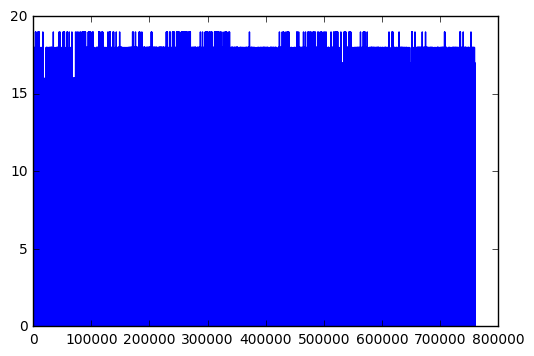

In [25]:
plt.plot(result)

In [26]:
Counter(result)

Counter({0: 730382,
         1: 844,
         2: 2354,
         3: 1463,
         4: 248,
         5: 411,
         6: 384,
         7: 450,
         8: 4184,
         9: 3183,
         10: 1012,
         11: 79,
         12: 1273,
         13: 551,
         14: 1887,
         15: 969,
         16: 7803,
         17: 742,
         18: 1832,
         19: 362})

In [100]:
from nltk.tokenize.regexp import RegexpTokenizer
from nltk.tokenize.regexp import WordPunctTokenizer

regex_tokenizer = RegexpTokenizer(r'\w+')
wp_tokenizer = WordPunctTokenizer()

NIV_base_old_token = regex_tokenizer.tokenize(NIV_base_old)
NIV_chapters_list = list(NIV_chapters.values())
NIV_chapters_list_token = [regex_tokenizer.tokenize(chapter) for chapter in NIV_chapters_list]


In [101]:
# stopwords
import operator
sorted(Counter(NIV_base_old_token).items(), key=operator.itemgetter(1), reverse=True)




[('the', 41259),
 ('and', 21937),
 ('of', 20309),
 ('to', 15185),
 ('you', 8713),
 ('will', 8301),
 ('in', 7925),
 ('a', 6582),
 ('I', 6552),
 ('Lord', 6400),
 ('his', 5454),
 ('your', 5420),
 ('he', 5015),
 ('is', 4895),
 ('for', 4731),
 ('with', 4445),
 ('them', 3986),
 ('not', 3953),
 ('from', 3734),
 ('be', 3634),
 ('my', 3627),
 ('that', 3557),
 ('they', 3500),
 ('him', 3493),
 ('it', 3436),
 ('all', 3410),
 ('on', 3368),
 ('The', 3231),
 ('me', 3169),
 ('who', 3148),
 ('have', 3036),
 ('their', 2989),
 ('was', 2774),
 ('are', 2698),
 ('God', 2668),
 ('as', 2639),
 ('said', 2291),
 ('king', 2122),
 ('had', 2053),
 ('s', 2000),
 ('out', 1863),
 ('son', 1854),
 ('Israel', 1817),
 ('people', 1811),
 ('were', 1790),
 ('He', 1772),
 ('this', 1770),
 ('has', 1678),
 ('Then', 1651),
 ('by', 1552),
 ('man', 1498),
 ('one', 1488),
 ('or', 1480),
 ('up', 1465),
 ('at', 1447),
 ('men', 1428),
 ('land', 1418),
 ('but', 1414),
 ('what', 1401),
 ('her', 1348),
 ('They', 1265),
 ('do', 1225),
 (

In [102]:
from nltk.corpus import stopwords

import string
stop = stopwords.words('english') + list(string.punctuation)

from nltk.stem.porter import PorterStemmer

stemmer = PorterStemmer()


NIV_base_old_token = [stemmer.stem(token) for token in NIV_base_old_token if token not in stop]
NIV_chapters_list_token = [[stemmer.stem(token) for token in chapter if token not in stop] for chapter in NIV_chapters_list_token]


NIV_chapters_list_token

[['1',
  'When',
  'King',
  'David',
  'old',
  'well',
  'advanc',
  'year',
  'could',
  'keep',
  'warm',
  'even',
  'put',
  'cover',
  '2',
  'So',
  'servant',
  'said',
  'Let',
  'us',
  'look',
  'young',
  'virgin',
  'attend',
  'king',
  'take',
  'care',
  'She',
  'lie',
  'besid',
  'lord',
  'king',
  'may',
  'keep',
  'warm',
  '3',
  'Then',
  'search',
  'throughout',
  'Israel',
  'beauti',
  'girl',
  'found',
  'Abishag',
  'Shunammit',
  'brought',
  'king',
  '4',
  'The',
  'girl',
  'beauti',
  'took',
  'care',
  'king',
  'wait',
  'king',
  'intim',
  'relat',
  '5',
  'Now',
  'Adonijah',
  'whose',
  'mother',
  'Haggith',
  'put',
  'forward',
  'said',
  'I',
  'king',
  'So',
  'got',
  'chariot',
  'hors',
  'readi',
  'fifti',
  'men',
  'run',
  'ahead',
  '6',
  'Hi',
  'father',
  'never',
  'interf',
  'ask',
  'Whi',
  'behav',
  'He',
  'also',
  'handsom',
  'born',
  'next',
  'Absalom',
  '7',
  'Adonijah',
  'confer',
  'Joab',
  'son',


In [103]:
NIV_base_old_token = ' '.join(NIV_base_old_token)
# todo punctuation?
NIV_chapters_list_token = [' '.join(chapter) for chapter in NIV_chapters_list_token]
# remove digits
NIV_chapters_list_token = [re.sub(r'\b\d+\b', '', chapter) for chapter in NIV_chapters_list_token]
NIV_chapters_list_token

[' When King David old well advanc year could keep warm even put cover  So servant said Let us look young virgin attend king take care She lie besid lord king may keep warm  Then search throughout Israel beauti girl found Abishag Shunammit brought king  The girl beauti took care king wait king intim relat  Now Adonijah whose mother Haggith put forward said I king So got chariot hors readi fifti men run ahead  Hi father never interf ask Whi behav He also handsom born next Absalom  Adonijah confer Joab son Zeruiah Abiathar priest gave support  But Zadok priest Benaiah son Jehoiada Nathan prophet Shimei Rei David special guard join Adonijah  Adonijah sacrif sheep cattl fatten calv Stone Zoheleth near En Rogel He invit brother king son men Judah royal offici  invit Nathan prophet Benaiah special guard brother Solomon  Then Nathan ask Bathsheba Solomon mother Have heard Adonijah son Haggith becom king without lord David know  Now let advis save life life son Solomon  Go King David say My lo

In [104]:
from sklearn.feature_extraction.text import CountVectorizer

In [105]:
cv = CountVectorizer(encoding='uft-16', stop_words='english')
#tdm_matrix = cv.fit_transform(raw_documents=NIV_chapters.values())
tdm_matrix = cv.fit_transform(raw_documents=NIV_chapters_list_token)
tdm_matrix.shape


(66, 8701)

In [106]:
import lda
model = lda.LDA(n_topics=30, n_iter=2000, random_state=1)
model.fit(tdm_matrix)

INFO:lda:n_documents: 66
INFO:lda:vocab_size: 8701
INFO:lda:n_words: 290832
INFO:lda:n_topics: 30
INFO:lda:n_iter: 2000
INFO:lda:<0> log likelihood: -3348502
INFO:lda:<10> log likelihood: -2465088
INFO:lda:<20> log likelihood: -2338118
INFO:lda:<30> log likelihood: -2298387
INFO:lda:<40> log likelihood: -2275983
INFO:lda:<50> log likelihood: -2261753
INFO:lda:<60> log likelihood: -2252200
INFO:lda:<70> log likelihood: -2244996
INFO:lda:<80> log likelihood: -2240559
INFO:lda:<90> log likelihood: -2236309
INFO:lda:<100> log likelihood: -2231443
INFO:lda:<110> log likelihood: -2230132
INFO:lda:<120> log likelihood: -2228420
INFO:lda:<130> log likelihood: -2224612
INFO:lda:<140> log likelihood: -2223231
INFO:lda:<150> log likelihood: -2221739
INFO:lda:<160> log likelihood: -2219865
INFO:lda:<170> log likelihood: -2216984
INFO:lda:<180> log likelihood: -2217376
INFO:lda:<190> log likelihood: -2217236
INFO:lda:<200> log likelihood: -2217346
INFO:lda:<210> log likelihood: -2214464
INFO:lda:<2

In [107]:
vocab = cv.get_feature_names()
topic_word = model.topic_word_  # model.components_ also works
n_top_words = 10
for i, topic_dist in enumerate(topic_word):
    topic_words = numpy.array(vocab)[numpy.argsort(topic_dist)][:-(n_top_words+1):-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: day peopl nation like say make come citi bring destroy
Topic 1: christ god jesu faith lord spirit bodi grace love brother
Topic 2: come know say man life time anoth anyon die thi
Topic 3: lord say king declar judah babylon thi son land almighti
Topic 4: son father david descend men god famili rel charg divis
Topic 5: daughter field mother children said law peopl hous return work
Topic 6: lord prais god let love psalm forev heart enemi long
Topic 7: god law live sin son command children obey set brother
Topic 8: jesu said son discipl ask man came went father tell
Topic 9: israel son men israelit went took ephraim baal camp gilead
Topic 10: paul peter jew jerusalem day spirit holi brother peopl speak
Topic 11: son said father jacob joseph brother abraham live land wife
Topic 12: town joshua tribe jordan king citi clan israelit inherit mose
Topic 13: offer priest lord unclean sin shall day blood make bring
Topic 14: man wick wisdom heart wise evil fool righteou understand way
Top